In [1]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.colors as pc

#### Load Data

In [2]:
subjects = pd.read_csv("data/treadmill/subject-info.csv")
measures = pd.read_csv("data/treadmill/test_measure.csv")

subjects = subjects.sort_values(by=["ID_test"])
measures = measures.sort_values(by=["ID_test", "time"])

measures["O2_rate"] = measures["VO2"]
measures["CO2_rate"] = measures["VCO2"]
measures["air_rate"] = measures["VE"]

measures["O2_vol"] = measures["O2_rate"] / measures["RR"]
measures["CO2_vol"] = measures["CO2_rate"] / measures["RR"]
measures["air_vol"] = measures["air_rate"] / measures["RR"]

measures["O2_cum"] = measures.groupby("ID_test")["O2_vol"].cumsum()
measures["CO2_cum"] = measures.groupby("ID_test")["CO2_vol"].cumsum()
measures["air_cum"] = measures.groupby("ID_test")["air_vol"].cumsum()

measures = measures.drop(columns=["VO2", "VCO2", "VE"])

# Define numerical features
measures_numerical = {'time', 'Speed', 'HR', 'RR', 'O2_rate', 'CO2_rate',
       'air_rate', 'O2_vol', 'CO2_vol', 'air_vol', 'O2_cum', 'CO2_cum',
       'air_cum', 'Age', 'Weight', 'Height', 'Humidity', 'Temperature'}

In [3]:
measures.head()

,time,Speed,HR,RR,ID_test,ID,O2_rate,CO2_rate,air_rate,O2_vol,CO2_vol,air_vol,O2_cum,CO2_cum,air_cum
68847,0,5.0,NaN,20,100_1,100,386.0,256.0,10.1,19.300000,12.800000,0.505000,19.300000,12.800000,0.505000
68848,2,5.0,NaN,26,100_1,100,617.0,423.0,14.2,23.730769,16.269231,0.546154,43.030769,29.069231,1.051154
68849,5,5.0,54.0,20,100_1,100,386.0,255.0,10.1,19.300000,12.750000,0.505000,62.330769,41.819231,1.556154
68850,7,5.0,NaN,23,100_1,100,488.0,329.0,11.9,21.217391,14.304348,0.517391,83.548161,56.123579,2.073545
68851,9,5.0,91.0,25,100_1,100,506.0,344.0,12.8,20.240000,13.760000,0.512000,103.788161,69.883579,2.585545


In [4]:
subjects.head()

,Age,Weight,Height,Humidity,Temperature,Sex,ID,ID_test
879,42.1,76.0,167.0,39.0,17.60,0,100,100_1
852,41.0,81.0,173.0,39.0,17.60,0,101,101_1
639,31.9,108.0,179.0,47.0,18.09,0,102,102_1
664,33.0,101.0,199.0,47.0,18.09,0,103,103_1
622,31.4,78.0,176.0,48.0,21.50,0,104,104_1


#### Normalizes start times to zero

Each test starts at approximately 5km/hr and increases at a rate of 60 km/hr^2

In [5]:
# Normalizes the start times of the test from start speed of 5 km/h
measures_test = measures[measures["Speed"] > 5]
normal_starts = measures_test.groupby("ID_test")["time"].transform("first")
measures_test.loc[:,"time"] = measures_test["time"] - normal_starts

# Normalizes the start times of the test from start speed of 6.1 km/h
ids_slow = measures_test[(measures_test["Speed"]==6.1) &(measures_test["time"]>100)]["ID_test"].unique()
first_steps = measures_test[measures_test["ID_test"].isin(ids_slow) & (measures_test["Speed"] > 6.1)].groupby("ID_test")["time"].first()
measures_test.loc[:,"time"] = measures_test["time"] - measures["ID_test"].map(first_steps).fillna(0)
measures_test = measures_test[measures_test["time"] > 0]

# Remove tests with non-standard speeds increase rates
outlier_ids = list(measures_test[(measures_test["time"].between(276,301)) & (measures_test["Speed"] > 11.4)]["ID_test"].unique())
outlier_ids += ["715_1", "796_1", "593_1", "789_1", "479_1"]
measures_test = measures_test[(measures_test["time"] > 0) & (~measures_test["ID_test"].isin(outlier_ids))]

# Remove cooldown periods
measures_test = measures_test[~((measures_test["time"] > 600) & (measures_test["Speed"] < 12))]

# Start all tests at time 0
measures_test.loc[:,"time"] = measures_test["time"] - measures_test.groupby("ID_test")["time"].transform("min")

# Join with subjects
measures_test = measures_test.merge(subjects, on=["ID_test", "ID"], how="left")

# Compute max speed attained quintile
measures_test["max_speed_quintile"] = measures_test["ID_test"].map(pd.qcut(measures_test.groupby("ID_test")["Speed"].max(), 5, labels=False))

C:\Users\Huize\AppData\Local\Temp\ipykernel_10248\2813270213.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  measures_test.loc[:,"time"] = measures_test["time"] - normal_starts
C:\Users\Huize\AppData\Local\Temp\ipykernel_10248\2813270213.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  measures_test.loc[:,"time"] = measures_test["time"] - measures["ID_test"].map(first_steps).fillna(0)
C:\Users\Huize\AppData\Local\Temp\ipykernel_10248\2813270213.py:9: DeprecationWarning: In a future version, `df.iloc[

#### Generate Color Scale

In [6]:
# Generate color scale based on max speed attained
color_data = measures_test.groupby("ID_test")["Speed"].max()

hover_texts = [f"Max Treadmill Speed: {d:.2f}" for d in color_data]

n_bins = 5
bin_ids = pd.qcut(color_data, q=n_bins, labels=False, duplicates='drop')

colorscale = pc.get_colorscale('bluered')
discrete_colors = pc.sample_colorscale(colorscale, [i / (n_bins - 1) for i in range(n_bins)])

colors = [discrete_colors[b] for b in bin_ids]

#### Plots

In [7]:
# Plot O2 Exchange Efficiency - Percent of O2 consumed by the body in each breath
fig = go.Figure()

for i, test in enumerate(measures_test["ID_test"].unique()):

    t1 = measures_test[measures_test["ID_test"]==test]

    fig.add_trace(
        go.Scatter(
            x=t1["time"],
            #y=t1["Speed"],
            y=t1["O2_vol"].rolling(window=10).mean() / (t1["air_vol"].rolling(window=10).mean() * 1000 * .2095) * 100,
            mode="lines",
            line=dict(color=colors[i], width=.1),
            name=test,
            showlegend=True,
            hovertext=hover_texts[i],
        )
    )

fig.update_layout(
    title = dict(text="O2 Exchange Efficiency in Maximal Treadmill Exercise Test"),
    xaxis=dict(title="Seconds"),
    yaxis=dict(title="O2 Exchange Effficiency (%)"),
    legend=dict(title="ID Test"),
    height= 800,
    width=1000
)

fig.show()

In [12]:
measures_test.columns

Index(['time', 'Speed', 'HR', 'RR', 'ID_test', 'ID', 'O2_rate', 'CO2_rate',
       'air_rate', 'O2_vol', 'CO2_vol', 'air_vol', 'O2_cum', 'CO2_cum',
       'air_cum', 'Age', 'Weight', 'Height', 'Humidity', 'Temperature', 'Sex',
       'max_speed_quintile'],
      dtype='object')

In [14]:
measures_test

,time,Speed,HR,RR,ID_test,ID,O2_rate,CO2_rate,air_rate,O2_vol,...,O2_cum,CO2_cum,air_cum,Age,Weight,Height,Humidity,Temperature,Sex,max_speed_quintile
0,0.0,5.2,91.0,25,100_1,100,1084.0,815.0,24.5,43.360000,...,2765.584393,1919.215062,60.058248,42.1,76.0,167.0,39.0,17.6,0,2
1,4.0,5.3,90.0,25,100_1,100,1084.0,815.0,24.5,43.360000,...,2808.944393,1951.815062,61.038248,42.1,76.0,167.0,39.0,17.6,0,2
2,6.0,5.3,88.0,27,100_1,100,982.0,736.0,22.9,36.370370,...,2845.314763,1979.074321,61.886396,42.1,76.0,167.0,39.0,17.6,0,2
3,7.0,5.3,89.0,28,100_1,100,1009.0,744.0,22.7,36.035714,...,2881.350477,2005.645750,62.697110,42.1,76.0,167.0,39.0,17.6,0,2
4,9.0,5.3,92.0,29,100_1,100,969.0,707.0,21.8,33.413793,...,2914.764270,2030.025060,63.448835,42.1,76.0,167.0,39.0,17.6,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379785,468.0,12.9,152.0,47,9_1,9,2098.0,2663.0,82.5,44.638298,...,17339.363256,18341.066558,507.518323,24.5,72.0,167.0,69.0,22.0,1,0
379786,469.0,12.9,155.0,49,9_1,9,2066.0,2625.0,81.8,42.163265,...,17381.526521,18394.637986,509.187711,24.5,72.0,167.0,69.0,22.0,1,0
379787,470.0,13.0,158.0,49,9_1,9,2084.0,2660.0,82.2,42.530612,...,17424.057133,18448.923701,510.865262,24.5,72.0,167.0,69.0,22.0,1,0
379788,471.0,13.0,168.0,49,9_1,9,2065.0,2617.0,80.0,42.142857,...,17466.199990,18502.331864,512.497915,24.5,72.0,167.0,69.0,22.0,1,0


A potentially interesting finding below - it seems that once a person is so tired that they can only capture ~ 13-14% of the oxygen from each breath they take, they reach exhaustion.

In [8]:
# Same plot as above but grouped by quintile of max speed attained 
fig = go.Figure()

measures_quintiles = measures_test.groupby(["max_speed_quintile", "time"])[list(measures_numerical-{"time"})].mean().reset_index()

for quintile in measures_quintiles["max_speed_quintile"].unique():

    t1 = measures_quintiles[measures_quintiles["max_speed_quintile"]==quintile]

    fig.add_trace(
        go.Scatter(
            x=t1["time"],
            #x=t1["Speed"],
            y=t1["O2_vol"].rolling(window=20).mean() / (t1["air_vol"].rolling(window=20).mean() * 1000 * .2095) * 100,
            mode="lines",
            line=dict(color=discrete_colors[quintile], width=2),
            name=f"Quintile {quintile + 1}",
            showlegend=True,
        )
    )

fig.update_layout(
    title = dict(text="O2 Exchange Efficiency in Maximal Treadmill Exercise Test By Quintile of Max Speed Attained"),
    xaxis=dict(title="Seconds on Treadmill"),
    yaxis=dict(title="O2 Exchange Effficiency (%)"),
    legend=dict(title="ID Test"),
    height= 800,
    width=1000
)

fig.show()


Time-Series Clustering for O2 

c:\Users\Huize\anaconda3\Lib\site-packages\scipy\interpolate\_interpolate.py:698: RuntimeWarning:

divide by zero encountered in divide

c:\Users\Huize\anaconda3\Lib\site-packages\scipy\interpolate\_interpolate.py:701: RuntimeWarning:

invalid value encountered in multiply



Individuals used for clustering: 651
Feature matrix size (rows × cols): 651 × 550


c:\Users\Huize\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

c:\Users\Huize\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

c:\Users\Huize\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

c:\Users\Huize\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than 

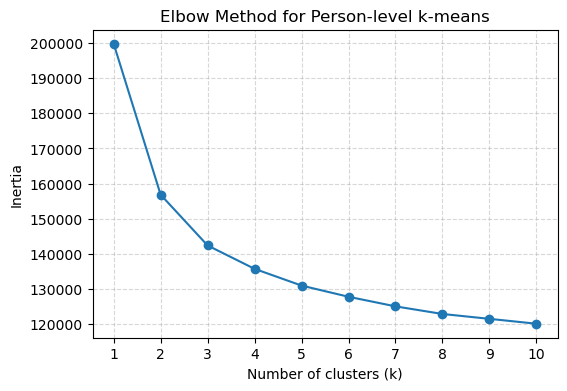

In [79]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# ─── PARAMETERS ────────────────────────────────────────────────────────────────
to_keep       = 550               # number of points to resample per test
k_candidates  = range(1, 11)      # for elbow plot

# ─── A) Filter to only (ID, ID_test) pairs that lasted ≥ to_keep seconds ───────
durations = measures_test.groupby(['ID', 'ID_test'])['time'].max()
good_pairs = durations[durations >= to_keep].index  # MultiIndex of (ID, ID_test)
mt = measures_test.set_index(['ID', 'ID_test']).loc[good_pairs].reset_index()

# ─── B) Resample each test to exactly to_keep points ──────────────────────────
test_vectors, person_ids, test_ids = [], [], []
for (pid, tid), grp in mt.groupby(['ID', 'ID_test']):
    grp = grp.sort_values('time')
    f     = interp1d(grp['time'], grp['O2_vol'], kind='linear', fill_value='extrapolate')
    t_new = np.linspace(grp['time'].iloc[0], grp['time'].iloc[-1], to_keep)
    test_vectors.append(f(t_new))
    person_ids.append(pid)
    test_ids.append(tid)

df_tests = pd.DataFrame(
    test_vectors,
    index=pd.MultiIndex.from_arrays([person_ids, test_ids], names=['ID', 'ID_test']),
    columns=np.arange(to_keep)
)

# ─── C) Drop any test‐rows with NaNs or zero variance ────────────────────────
mask_bad = df_tests.isna().any(axis=1) | (df_tests.std(axis=1) == 0)
df_tests = df_tests.loc[~mask_bad]

# ─── D) Collapse to one series per person (average across their tests) ────────
df_people = df_tests.groupby(level='ID').mean()

# ─── E) Build feature matrix X and remove zero‐variance rows ───────────────────
X = df_people.values  # shape: (n_people, to_keep)
std_per_person = X.std(axis=1)
mask_nonzero   = std_per_person > 0
X              = X[mask_nonzero]
person_ids_f   = np.array(df_people.index)[mask_nonzero]

# ─── F) Z‐normalize each person’s vector ───────────────────────────────────────
eps    = 1e-8
means  = X.mean(axis=1, keepdims=True)
stds   = X.std(axis=1, keepdims=True)
data_z = (X - means) / (stds + eps)

print(f"Individuals used for clustering: {data_z.shape[0]}")
print(f"Feature matrix size (rows × cols): {data_z.shape[0]} × {data_z.shape[1]}")

# ─── G) Elbow chart ────────────────────────────────────────────────────────────
inertias = []
for k in k_candidates:
    km = KMeans(n_clusters=k, n_init=10, random_state=42)
    km.fit(data_z)
    inertias.append(km.inertia_)

plt.figure(figsize=(6, 4))
plt.plot(list(k_candidates), inertias, 'o-', markersize=6)
plt.xticks(list(k_candidates))
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Person-level k-means')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


In [84]:
k_opt = 2
# ─── H) Final clustering & mapping ────────────────────────────────────────────
km_final = KMeans(n_clusters=k_opt, n_init=10, random_state=42)
labels   = km_final.fit_predict(data_z)

# Map each person to their cluster
cluster_map_person = dict(zip(person_ids_f, labels))

# Attach to df_people
df_people = df_people.loc[person_ids_f]
df_people['cluster'] = df_people.index.map(cluster_map_person)

# Attach to mt (per-test) via person ID
mt['cluster'] = mt['ID'].map(cluster_map_person)

print("Cluster counts (per person):")
print(df_people['cluster'].value_counts())

c:\Users\Huize\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



Cluster counts (per person):
0    388
1    263
Name: cluster, dtype: int64


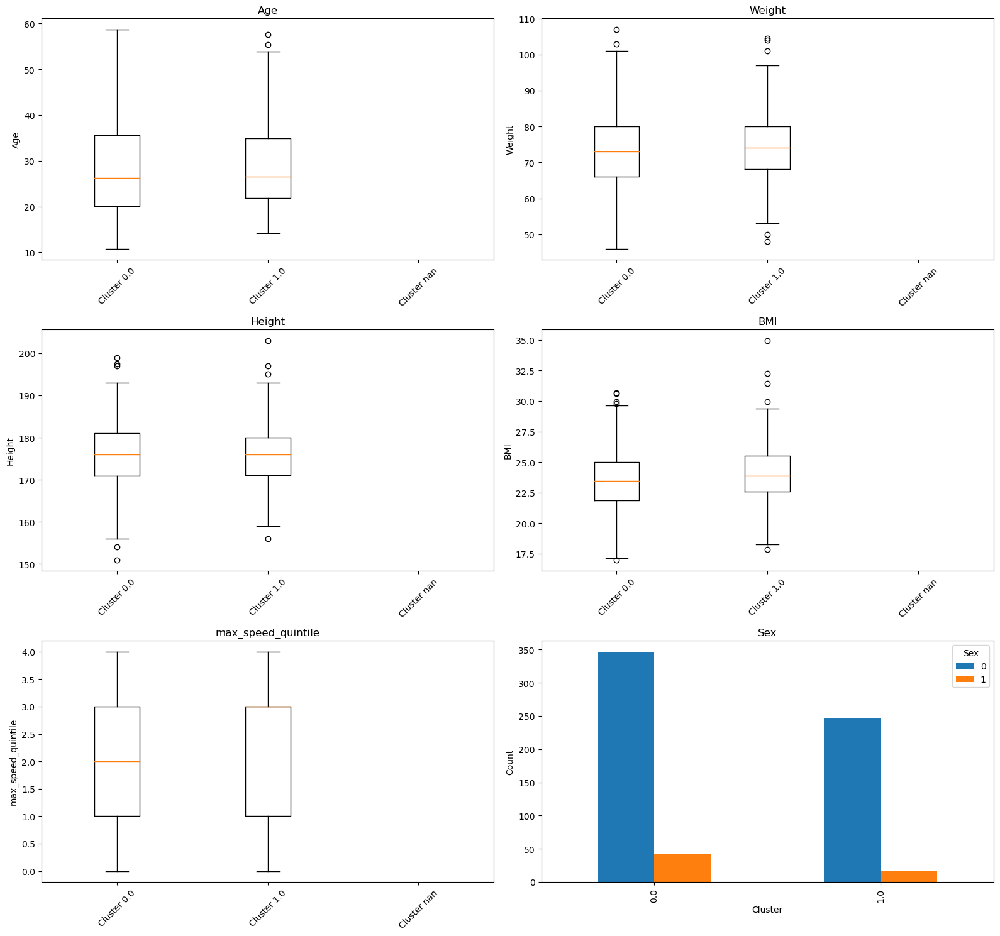

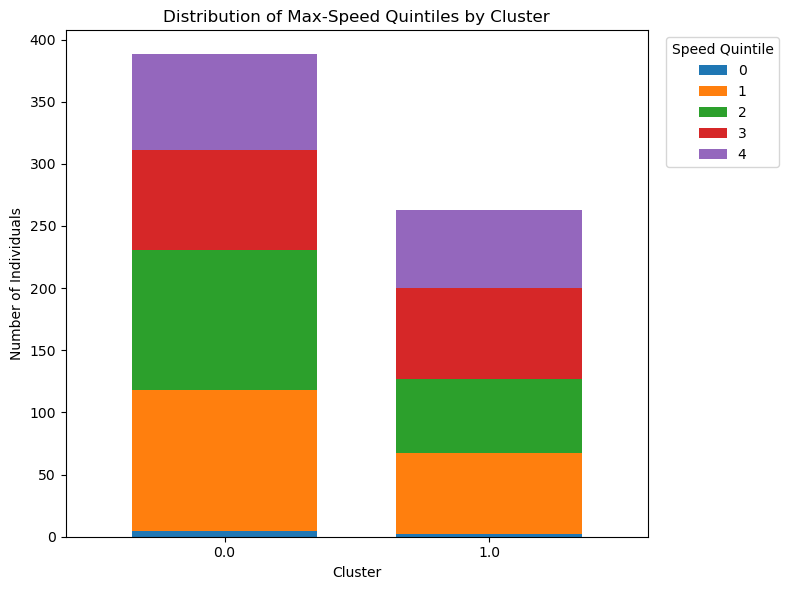

In [89]:
import math
import matplotlib.pyplot as plt

# 1) Build person-level metadata (ensure 'cluster' is mapped)
meta = (
    measures_test
      .groupby('ID')
      .first()[['Age','Weight','Height','Sex','max_speed_quintile']]
      .copy()
)
meta['cluster'] = meta.index.map(cluster_map_person)
meta['BMI'] = meta['Weight'] / ((meta['Height'] / 100) ** 2)

# 2) Define attributes
numeric_attributes     = ['Age','Weight','Height','BMI','max_speed_quintile']
categorical_attributes = ['Sex']
all_attributes         = numeric_attributes + categorical_attributes
clusters               = sorted(meta['cluster'].unique())

# 3) Compute grid dimensions: two plots per row
n_plots = len(all_attributes)
n_cols  = 2
n_rows  = math.ceil(n_plots / n_cols)

# 4) Create a larger figure with 2 columns per row
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 5 * n_rows))
axes = axes.flatten()

# 5) Plot numeric boxplots
for i, attr in enumerate(numeric_attributes):
    ax = axes[i]
    data = [meta.loc[meta['cluster'] == c, attr] for c in clusters]
    ax.boxplot(data)
    ax.set_title(attr)
    ax.set_xticks(range(1, len(clusters) + 1))
    ax.set_xticklabels([f"Cluster {c}" for c in clusters], rotation=45)
    ax.set_ylabel(attr)

# 6) Plot categorical bar charts
for j, attr in enumerate(categorical_attributes, start=len(numeric_attributes)):
    ax = axes[j]
    cat_dist = meta.groupby('cluster')[attr].value_counts().unstack(fill_value=0)
    cat_dist.plot(kind='bar', ax=ax)
    ax.set_title(attr)
    ax.set_xlabel('Cluster')
    ax.set_ylabel('Count')
    ax.legend(title=attr)

# 7) Remove any unused subplots
for k in range(n_plots, n_rows * n_cols):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.show()

import matplotlib.pyplot as plt

# Compute counts of max_speed_quintile per cluster
speed_dist = (
    meta
      .groupby('cluster')['max_speed_quintile']
      .value_counts()
      .unstack(fill_value=0)
      .sort_index(axis=1)   # ensure quintiles 0→4 are in order
)

# Plot as a stacked bar chart
ax = speed_dist.plot(
    kind='bar',
    stacked=True,
    figsize=(8, 6),
    width=0.7,
)

ax.set_title("Distribution of Max‐Speed Quintiles by Cluster")
ax.set_xlabel("Cluster")
ax.set_ylabel("Number of Individuals")
ax.legend(title="Speed Quintile", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()



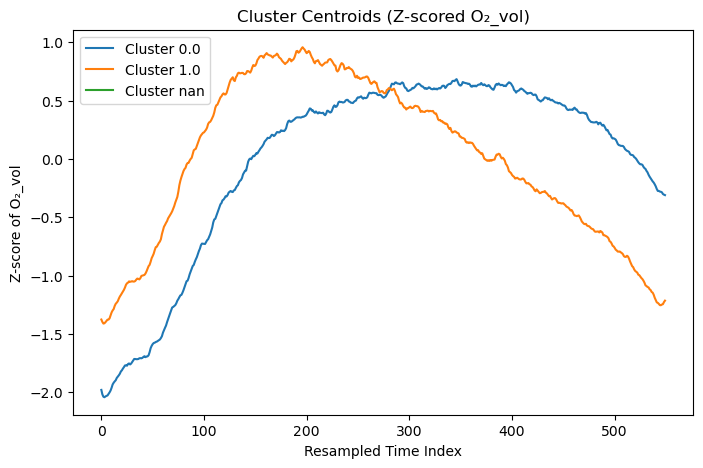

In [86]:
# 4) Visualize cluster centroids of the normalized O2_vol curves
# Reconstruct person-level curves from df_tests
person_curves = df_tests.groupby(level='ID').mean().loc[person_ids_f]
# Z-normalize
means = person_curves.mean(axis=1)
stds = person_curves.std(axis=1)
X_z = (person_curves.sub(means, axis=0)).div(stds+1e-8, axis=0)

centroids = []
for c in sorted(meta['cluster'].unique()):
    idx = meta['cluster'] == c
    centroids.append(X_z.loc[idx.index[idx]].mean(axis=0))

plt.figure(figsize=(8,5))
for c, cent in zip(sorted(meta['cluster'].unique()), centroids):
    plt.plot(cent.values, label=f"Cluster {c}")
plt.title("Cluster Centroids (Z-scored O₂_vol)")
plt.xlabel("Resampled Time Index")
plt.ylabel("Z-score of O₂_vol")
plt.legend()
plt.show()
